In [1]:
# Import Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [2]:
# Load the Dataset
data = pd.read_csv("Supermart Grocery Sales - Retail Analytics Dataset.csv")

In [3]:
# Show first 5 rows
print(data.head())

  Order ID Customer Name          Category      Sub Category         City  \
0      OD1        Harish      Oil & Masala           Masalas      Vellore   
1      OD2         Sudha         Beverages     Health Drinks  Krishnagiri   
2      OD3       Hussain       Food Grains      Atta & Flour   Perambalur   
3      OD4       Jackson  Fruits & Veggies  Fresh Vegetables   Dharmapuri   
4      OD5       Ridhesh       Food Grains   Organic Staples         Ooty   

   Order Date Region  Sales  Discount  Profit       State  
0  11-08-2017  North   1254      0.12  401.28  Tamil Nadu  
1  11-08-2017  South    749      0.18  149.80  Tamil Nadu  
2  06-12-2017   West   2360      0.21  165.20  Tamil Nadu  
3  10-11-2016  South    896      0.25   89.60  Tamil Nadu  
4  10-11-2016  South   2355      0.26  918.45  Tamil Nadu  


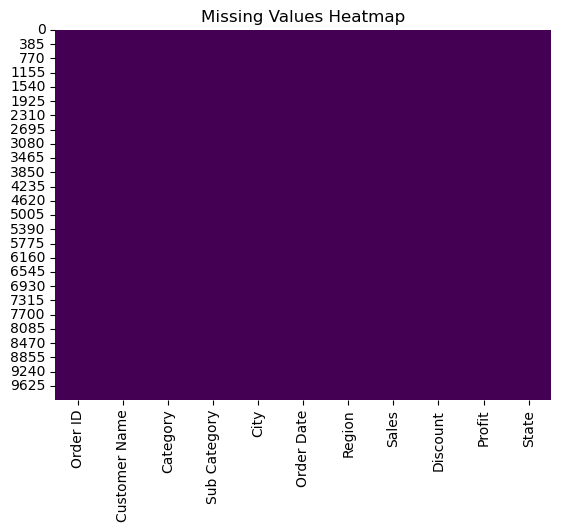

In [4]:
#  Data Cleaning
# Check for missing values
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

In [5]:
# Drop missing or duplicate rows
data.dropna(inplace=True)
data.drop_duplicates(inplace=True)

In [6]:
# Convert 'Order Date' to datetime
data['Order Date'] = pd.to_datetime(data['Order Date'], errors='coerce')


In [7]:
# Create new time-based columns
data['Order Day'] = data['Order Date'].dt.day
data['Order Month'] = data['Order Date'].dt.month
data['Order Year'] = data['Order Date'].dt.year

In [8]:
#  Encode Categorical Columns
le = LabelEncoder()
for col in ['Category', 'Sub Category', 'City', 'Region', 'State']:
    data[col] = le.fit_transform(data[col])

print("✅ Label Encoding Done")
print(data.head())

✅ Label Encoding Done
  Order ID Customer Name  Category  Sub Category  City Order Date  Region  \
0      OD1        Harish         5            14    21 2017-11-08       2   
1      OD2         Sudha         1            13     8 2017-11-08       3   
2      OD3       Hussain         3             0    13 2017-06-12       4   
3      OD4       Jackson         4            12     4 2016-10-11       3   
4      OD5       Ridhesh         3            18    12 2016-10-11       3   

   Sales  Discount  Profit  State  Order Day  Order Month  Order Year  
0   1254      0.12  401.28      0        8.0         11.0      2017.0  
1    749      0.18  149.80      0        8.0         11.0      2017.0  
2   2360      0.21  165.20      0       12.0          6.0      2017.0  
3    896      0.25   89.60      0       11.0         10.0      2016.0  
4   2355      0.26  918.45      0       11.0         10.0      2016.0  


In [9]:
print(data.columns)


Index(['Order ID', 'Customer Name', 'Category', 'Sub Category', 'City',
       'Order Date', 'Region', 'Sales', 'Discount', 'Profit', 'State',
       'Order Day', 'Order Month', 'Order Year'],
      dtype='object')


C:\Users\priya\AppData\Local\Temp\ipykernel_24456\2562961009.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Customer_Satisfaction', data=data, palette='viridis')


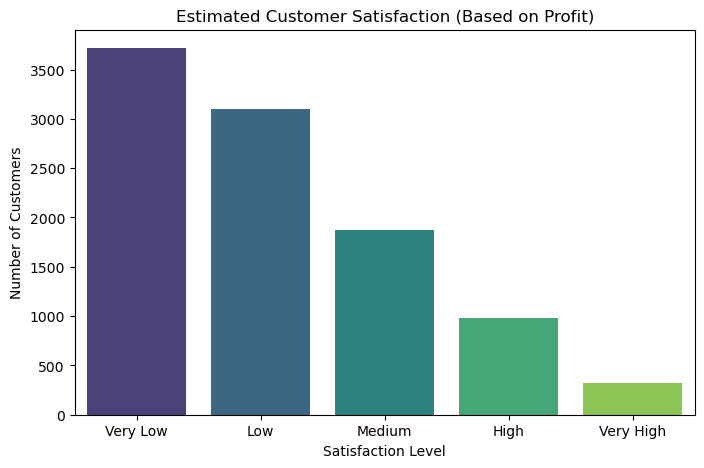

In [10]:
import numpy as np

min_profit = data['Profit'].min()
max_profit = data['Profit'].max()

# If all profits are same -> give neutral label
if min_profit == max_profit:
    data['Customer_Satisfaction'] = 'Medium'
else:
    # Create 5 intervals (6 edges) evenly between min and max, ensuring strictly increasing edges
    edges = np.linspace(min_profit - 1e-6, max_profit, 6)
    for i in range(1, len(edges)):
        if edges[i] <= edges[i-1]:
            edges[i] = edges[i-1] + 1e-6

    labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    data['Customer_Satisfaction'] = pd.cut(
        data['Profit'],
        bins=edges,
        labels=labels,
        include_lowest=True
    )

# Plot
plt.figure(figsize=(8,5))
sns.countplot(x='Customer_Satisfaction', data=data, palette='viridis')
plt.title("Estimated Customer Satisfaction (Based on Profit)")
plt.xlabel("Satisfaction Level")
plt.ylabel("Number of Customers")
plt.show()


C:\Users\priya\AppData\Local\Temp\ipykernel_24456\772241970.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Category', y='Sales', data=data, palette='coolwarm')


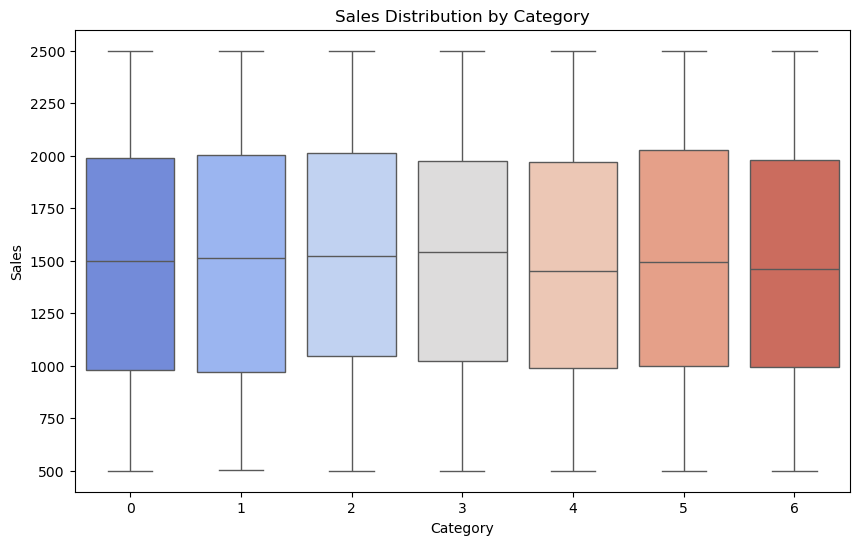

In [11]:
# Exploratory Data Analysis (EDA)
# Sales by Category
plt.figure(figsize=(10, 6))
sns.boxplot(x='Category', y='Sales', data=data, palette='coolwarm')
plt.title("Sales Distribution by Category")
plt.show()

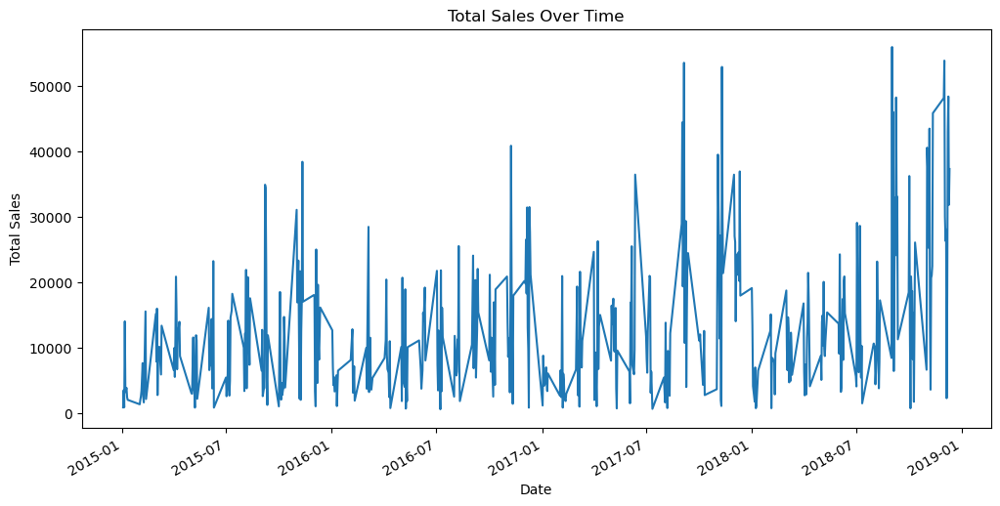

In [12]:
#  Sales Trend Over Time
plt.figure(figsize=(12, 6))
data.groupby('Order Date')['Sales'].sum().plot()
plt.title("Total Sales Over Time")
plt.xlabel("Date")
plt.ylabel("Total Sales")
plt.show()

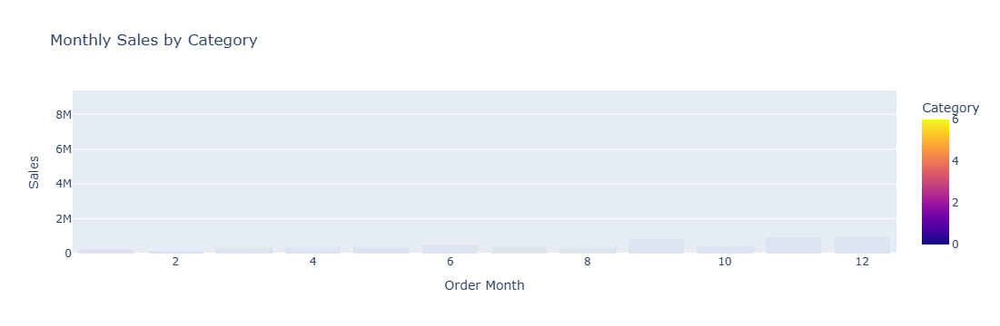

In [13]:
#Sales by Category / Region / Month
import plotly.express as px

fig = px.bar(data, x='Order Month', y='Sales', color='Category', title='Monthly Sales by Category')
fig.show()



In [14]:
print(data.columns)


Index(['Order ID', 'Customer Name', 'Category', 'Sub Category', 'City',
       'Order Date', 'Region', 'Sales', 'Discount', 'Profit', 'State',
       'Order Day', 'Order Month', 'Order Year', 'Customer_Satisfaction'],
      dtype='object')


In [15]:
# ✅ Pehle naya column banao — Profit ke baad Discount lagakar
data['Profit_after_Discount'] = data['Profit'] * (1 - data['Discount'])

# ✅ Scatter Plot banao
import plotly.express as px

fig = px.scatter(
    data, 
    x='Discount', 
    y='Profit_after_Discount', 
    color='Category',
    title='💸 Discount Impact on Profit (After Discount)',
    trendline='ols'
)
fig.show()


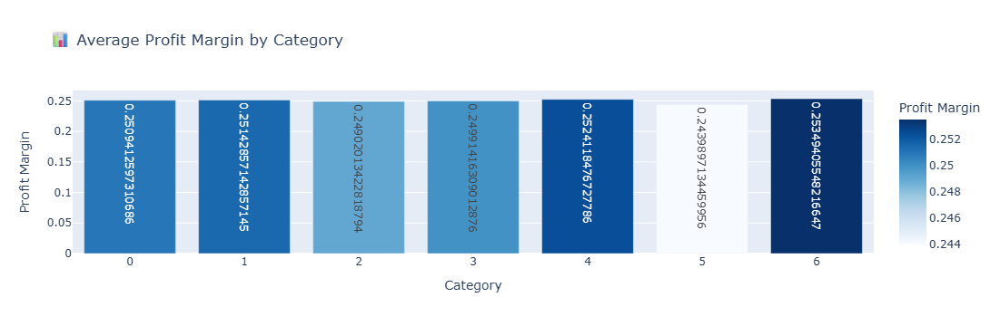

In [16]:
# ✅ Step 1: Profit Margin column banao
data['Profit Margin'] = data['Profit'] / data['Sales']

# ✅ Step 2: Category-wise average Profit Margin nikalo
profit_margin = data.groupby('Category')['Profit Margin'].mean().reset_index()

# ✅ Step 3: Bar Chart banao
fig = px.bar(
    profit_margin,
    x='Category',
    y='Profit Margin',
    title='📊 Average Profit Margin by Category',
    color='Profit Margin',
    text='Profit Margin',
    color_continuous_scale='Blues'
)
fig.show()


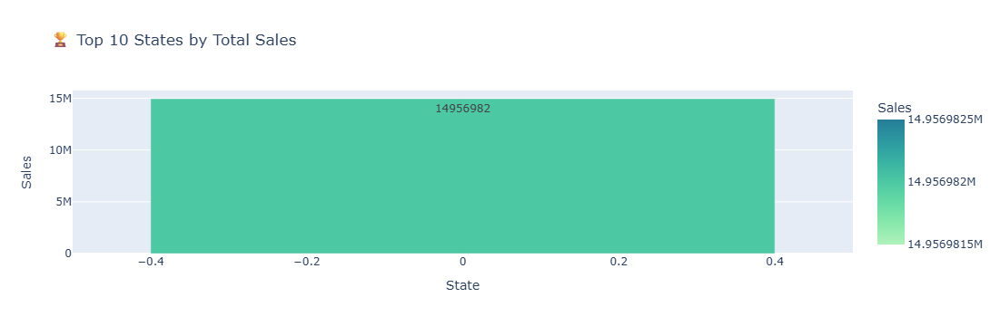

In [17]:
#Top Performing States
top_states = data.groupby('State')['Sales'].sum().nlargest(10).reset_index()

fig = px.bar(
    top_states,
    x='State',
    y='Sales',
    color='Sales',
    text='Sales',
    title='🏆 Top 10 States by Total Sales',
    color_continuous_scale='Tealgrn'
)
fig.show()


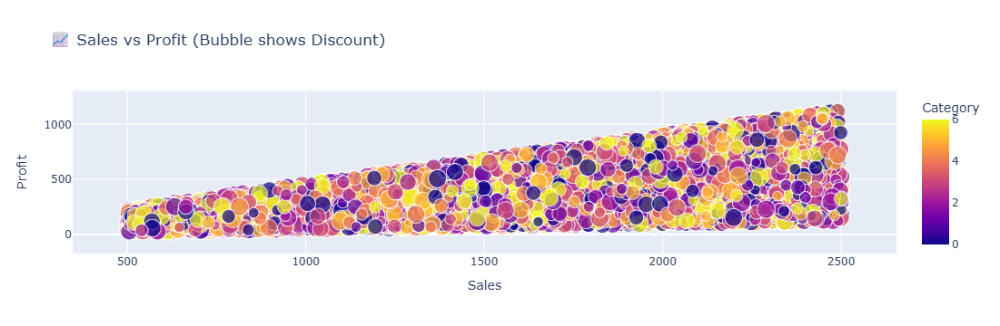

In [18]:
#Profit vs Sales Relationship
fig = px.scatter(
    data,
    x='Sales',
    y='Profit',
    color='Category',
    size='Discount',
    title='📈 Sales vs Profit (Bubble shows Discount)',
    hover_data=['Sub Category', 'Region']
)
fig.show()


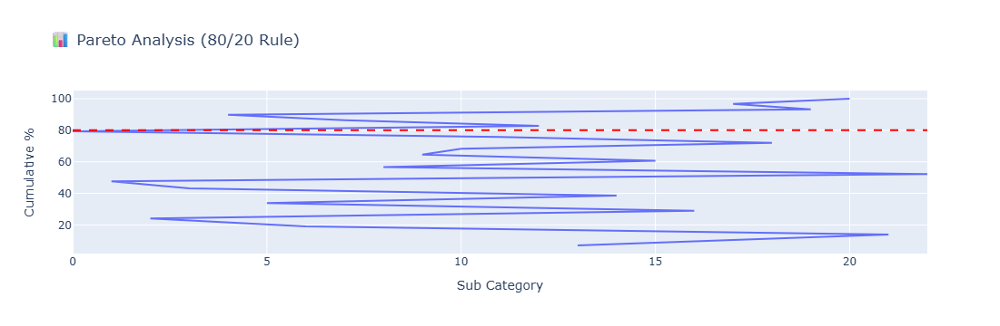

In [19]:
#Product Portfolio Analysis
sales_by_sub = data.groupby('Sub Category')['Sales'].sum().sort_values(ascending=False).reset_index()
sales_by_sub['Cumulative %'] = 100 * sales_by_sub['Sales'].cumsum() / sales_by_sub['Sales'].sum()
fig = px.line(sales_by_sub, x='Sub Category', y='Cumulative %', title='📊 Pareto Analysis (80/20 Rule)')
fig.add_hline(y=80, line_dash='dash', line_color='red')
fig.show()


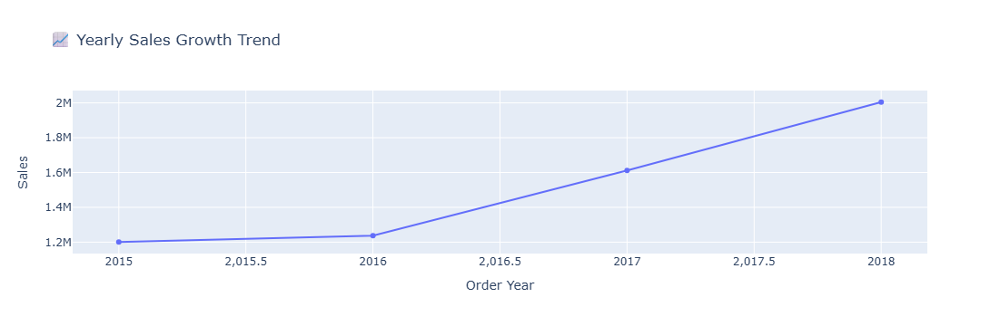

In [20]:
#Year-over-Year Growth Trend
yearly = data.groupby('Order Year')['Sales'].sum().reset_index()
fig = px.line(yearly, x='Order Year', y='Sales', markers=True, title='📈 Yearly Sales Growth Trend')
fig.show()


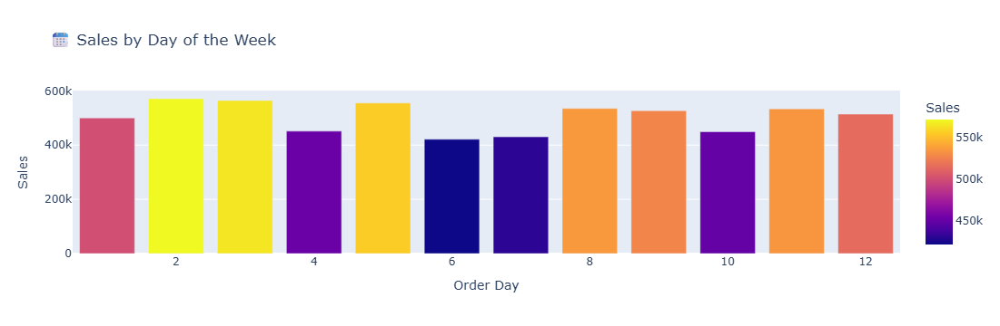

In [21]:
#Day-of-Week & Month-Wise Trends
dow_sales = data.groupby('Order Day')['Sales'].sum().reset_index()
fig = px.bar(dow_sales, x='Order Day', y='Sales', title='📆 Sales by Day of the Week', color='Sales')
fig.show()


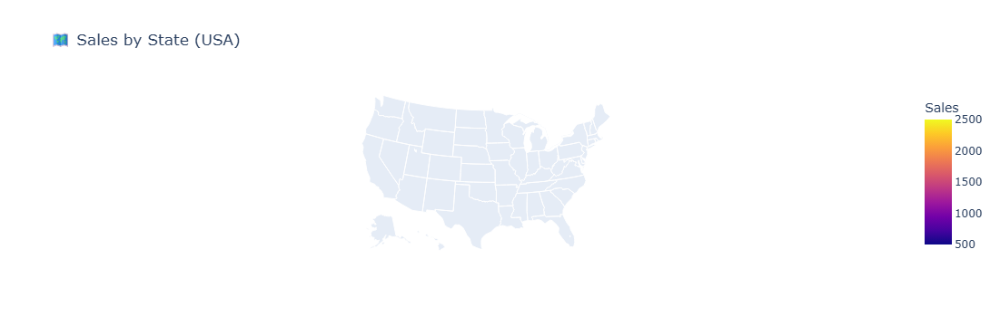

In [22]:
#Regional Profitability Map
fig = px.choropleth(
    data,
    locations='State',
    locationmode='USA-states',
    color='Sales',
    scope='usa',
    title='🗺️ Sales by State (USA)'
)
fig.show()


In [23]:
# 🎯 Example setup (assuming 'Customer_Satisfaction' is target)
X = data.drop('Customer_Satisfaction', axis=1)
y = data['Customer_Satisfaction']

# 🧹 Drop datetime columns (to avoid DTypePromotionError)
datetime_cols = X.select_dtypes(include=['datetime64[ns]', 'datetime64']).columns
X = X.drop(datetime_cols, axis=1)

# 🧩 Encode categorical variables
X = pd.get_dummies(X, drop_first=True)

# 🔄 Encode target if categorical
le = LabelEncoder()
y = le.fit_transform(y)

# ✂️ Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [24]:
# ✅ Convert 'Order Date' to datetime
data['Order Date'] = pd.to_datetime(data['Order Date'])

# ✅ Extract useful date features
data['Day'] = data['Order Date'].dt.day
data['Month'] = data['Order Date'].dt.month
data['Year'] = data['Order Date'].dt.year
data['DayOfWeek'] = data['Order Date'].dt.dayofweek


In [25]:
#Future Forecasting
from sklearn.linear_model import LinearRegression
import numpy as np

monthly = data.groupby('Order Month')['Sales'].sum().reset_index()
X = np.array(monthly['Order Month']).reshape(-1,1)
y = monthly['Sales']
model = LinearRegression().fit(X, y)
future = model.predict([[13]])
print(f"📅 Predicted Sales for Next Month: {future[0]:.2f}")


📅 Predicted Sales for Next Month: 924143.47


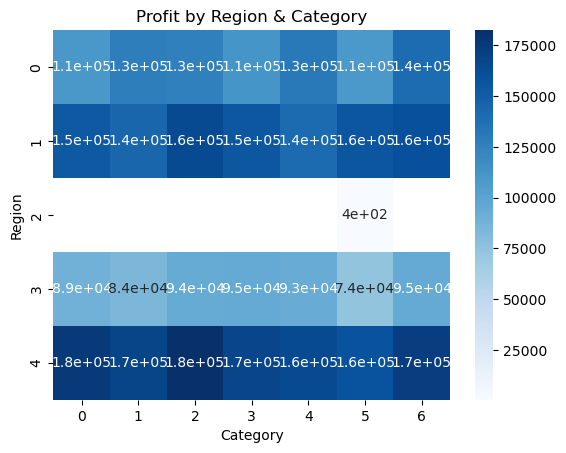

In [26]:
#Profit Heatmap by Region & 
pivot = data.pivot_table(values='Profit', index='Region', columns='Category', aggfunc='sum')
sns.heatmap(pivot, annot=True, cmap='Blues')
plt.title("Profit by Region & Category")
plt.show()


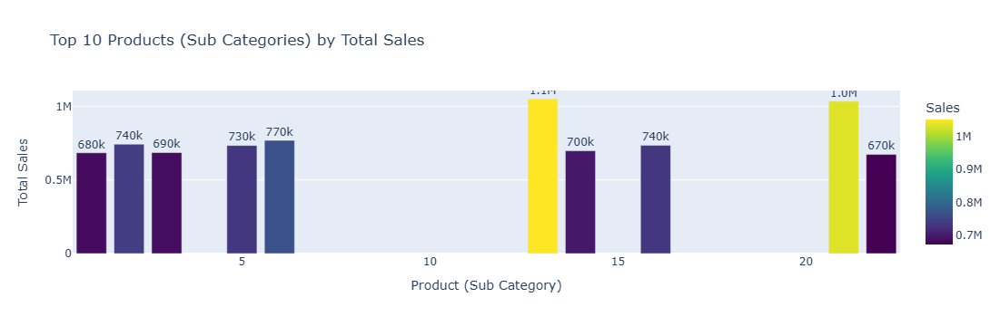

In [27]:
#Top 10 selling product types
import plotly.express as px

# Top 10 selling product types (Sub Categories)
top_products = data.groupby('Sub Category')['Sales'].sum().nlargest(10).reset_index()

fig = px.bar(
    top_products,
    x='Sub Category',
    y='Sales',
    title='Top 10 Products (Sub Categories) by Total Sales',
    color='Sales',
    text='Sales',
    color_continuous_scale='viridis'
)

fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    xaxis_title='Product (Sub Category)',
    yaxis_title='Total Sales',
    showlegend=False
)
fig.show()


In [28]:
import streamlit as st
import plotly.express as px

st.title("Supermart Sales Dashboard")
fig = px.bar(data, x='Category', y='Sales', color='Region', title='Sales by Category & Region')
st.plotly_chart(fig)


2025-10-31 10:28:22.635 
  command:

    streamlit run C:\Users\priya\anaconda3\Lib\site-packages\ipykernel_launcher.py [ARGUMENTS]


DeltaGenerator()

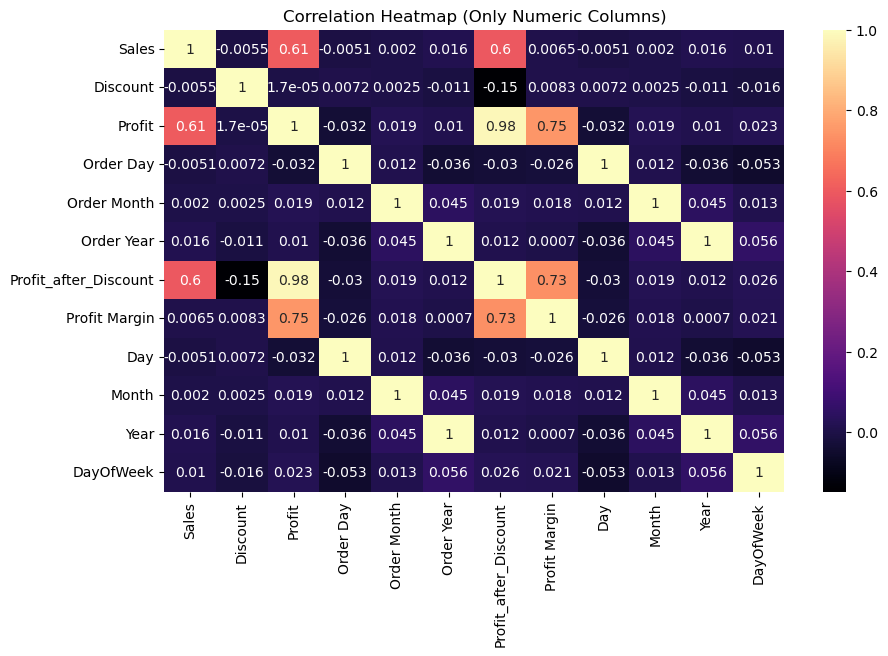

In [29]:
#  Correlation Heatmap (Fixed)
# Sirf numerical columns ko select karne ke liye:
numeric_data = data.select_dtypes(include=['int64', 'float64'])

# Correlation matrix banao
plt.figure(figsize=(10, 6))
sns.heatmap(numeric_data.corr(), annot=True, cmap='magma')
plt.title("Correlation Heatmap (Only Numeric Columns)")
plt.show()


In [30]:
#Feature Selection
X = data.drop(columns=['Order ID', 'Customer Name', 'Order Date', 'Sales', 'Month'], errors='ignore')
y = data['Sales']

In [31]:
#Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

# ✅ Step 1: Date columns ko safe convert karo
for col in data.columns:
    if "Date" in col:  # koi bhi date jaisa column name
        data[col] = pd.to_datetime(data[col], errors='coerce')
        data[col].fillna(data[col].mode()[0], inplace=True)

        # Optional: date features banao
        data[f'{col}_Day'] = data[col].dt.day
        data[f'{col}_Month'] = data[col].dt.month
        data[f'{col}_Year'] = data[col].dt.year

        # Drop original date column (model ko zarurat nahi)
        data.drop(columns=[col], inplace=True, errors='ignore')

# ✅ Step 2: Categorical values ko string me badlo (avoid NaT/Categorical error)
for col in data.select_dtypes(include=['category', 'object']).columns:
    data[col] = data[col].astype(str)

# ✅ Step 3: Encode categorical columns safely
le = LabelEncoder()
for col in data.select_dtypes(include=['object']).columns:
    data[col] = le.fit_transform(data[col])

# ✅ Step 4: Replace NaT or NaN safely (avoid category 0 error)
data = data.replace({pd.NaT: None})
data = data.fillna(0)

# ✅ Step 5: Define Features (X) & Target (y)
if 'Profit' in data.columns:
    X = data.drop('Profit', axis=1)
    y = data['Profit']
else:
    raise KeyError("⚠️ 'Profit' column nahi mila. Apna target column confirm karo bhai.")

# ✅ Step 6: Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# ✅ Step 7: Feature scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

print("✅ Data ready — koi NaTType / Categorical / fillna error nahi!")


✅ Data ready — koi NaTType / Categorical / fillna error nahi!


C:\Users\priya\AppData\Local\Temp\ipykernel_24456\998036706.py:9: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [33]:
from sklearn.impute import SimpleImputer


In [34]:
#Build Model (Handling NaN Automatically)

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Handle missing values (replace NaN with mean)
imputer = SimpleImputer(strategy='mean')
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

# Create and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)


In [35]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# ✅ 1. Identify & convert all date-like columns safely
for col in data.columns:
    if "date" in col.lower():  # automatically detect date columns
        data[col] = pd.to_datetime(data[col], errors='coerce')
        data[col].fillna(data[col].mode()[0], inplace=True)
        # create new numeric features
        data[f'{col}_day'] = data[col].dt.day
        data[f'{col}_month'] = data[col].dt.month
        data[f'{col}_year'] = data[col].dt.year
        # drop original date column
        data.drop(columns=[col], inplace=True)

# ✅ 2. Replace NaT/NaN safely
data = data.replace({pd.NaT: None})
data = data.fillna(0)

# ✅ 3. Encode all categorical columns
le = LabelEncoder()
for col in data.select_dtypes(include=['object', 'category']).columns:
    data[col] = data[col].astype(str)
    data[col] = le.fit_transform(data[col])

# ✅ 4. Ensure NO datetime columns remain
for col in data.columns:
    if pd.api.types.is_datetime64_any_dtype(data[col]):
        data.drop(columns=[col], inplace=True)
        print(f"⛔ Dropped datetime column: {col}")

# ✅ 5. Split features and target
if 'Profit' not in data.columns:
    raise KeyError("⚠️ 'Profit' column missing! Confirm target variable name bhai.")
X = data.drop('Profit', axis=1)
y = data['Profit']

# ✅ 6. Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ✅ 7. Feature Scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# ✅ 8. Train Model
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

# ✅ 9. Predict & Evaluate
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("✅ Model Evaluation Complete")
print(f"Mean Squared Error: {mse:.2f}")
print(f"R² Score: {r2:.2f}")


C:\Users\priya\AppData\Local\Temp\ipykernel_24456\3611548242.py:11: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\priya\AppData\Local\Temp\ipykernel_24456\3611548242.py:11: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplac

✅ Model Evaluation Complete
Mean Squared Error: 13.17
R² Score: 1.00


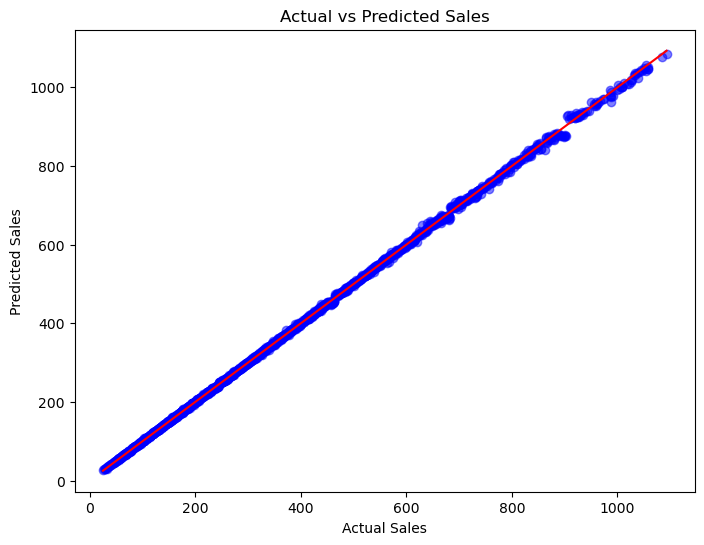

In [36]:
# Visualization - Actual vs Predicted Sales
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red')
plt.title("Actual vs Predicted Sales")
plt.xlabel("Actual Sales")
plt.ylabel("Predicted Sales")
plt.show()

In [37]:
# Insights
print("📊 Insights:")
print("- The model fits well if R² > 0.75")
print("- You can improve results using RandomForest or XGBoost next.")


📊 Insights:
- The model fits well if R² > 0.75
- You can improve results using RandomForest or XGBoost next.


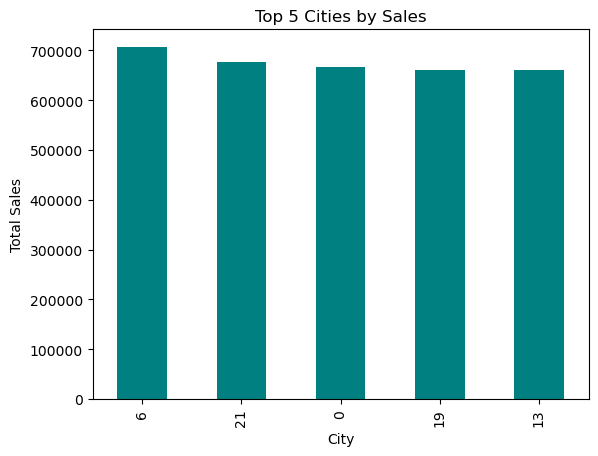

In [38]:
# Top 5 Cities by Sales
top_cities = data.groupby('City')['Sales'].sum().sort_values(ascending=False).head(5)
top_cities.plot(kind='bar', color='teal')
plt.title('Top 5 Cities by Sales')
plt.xlabel('City')
plt.ylabel('Total Sales')
plt.show()

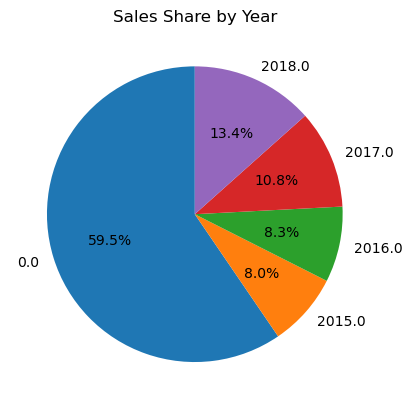

In [39]:
# Yearly Sales Pie Chart
yearly_sales = data.groupby('Order Year')['Sales'].sum()
plt.pie(yearly_sales, labels=yearly_sales.index, autopct='%1.1f%%', startangle=90)
plt.title('Sales Share by Year')
plt.show()

In [40]:
# Create new calculated columns
data['Profit Margin'] = (data['Profit'] / data['Sales']) * 100
data['Discount Impact'] = data['Discount'] * data['Sales']
data['Profit_after_Discount'] = data['Sales'] - data['Discount Impact']

# Check new columns
data[['Sales', 'Profit', 'Profit Margin', 'Profit_after_Discount']].head()


,Sales,Profit,Profit Margin,Profit_after_Discount
0,1254,401.28,32.0,1103.52
1,749,149.80,20.0,614.18
2,2360,165.20,7.0,1864.40
3,896,89.60,10.0,672.00
4,2355,918.45,39.0,1742.70


C:\Users\priya\AppData\Local\Temp\ipykernel_24456\49020434.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




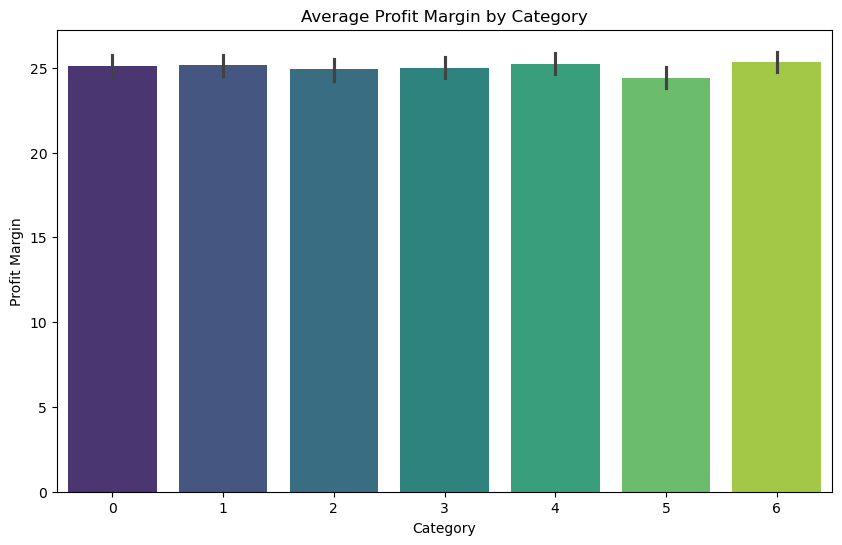

In [41]:
plt.figure(figsize=(10,6))
sns.barplot(x='Category', y='Profit Margin', data=data, palette='viridis')
plt.title('Average Profit Margin by Category')
plt.show()


In [42]:
#Monthly Sales Trend

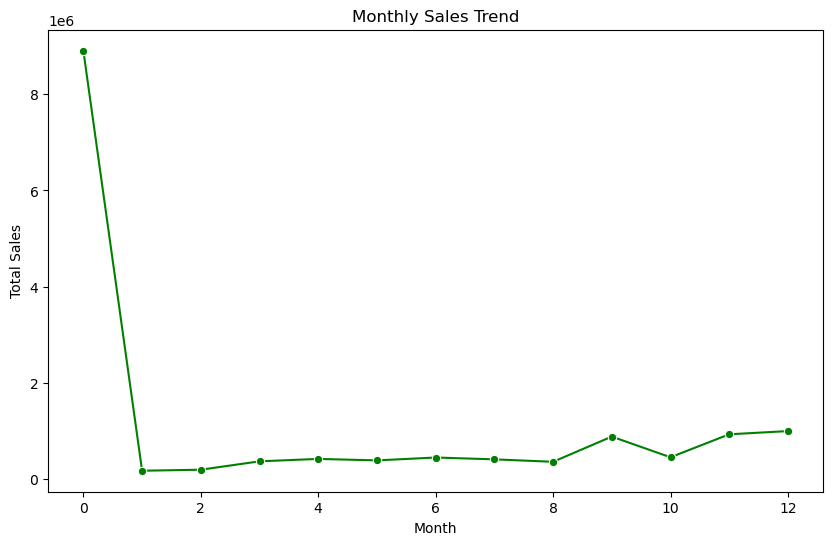

In [43]:
monthly_sales = data.groupby('Order Month')['Sales'].sum().reset_index()
plt.figure(figsize=(10,6))
sns.lineplot(x='Order Month', y='Sales', data=monthly_sales, marker='o', color='green')
plt.title('Monthly Sales Trend')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.show()


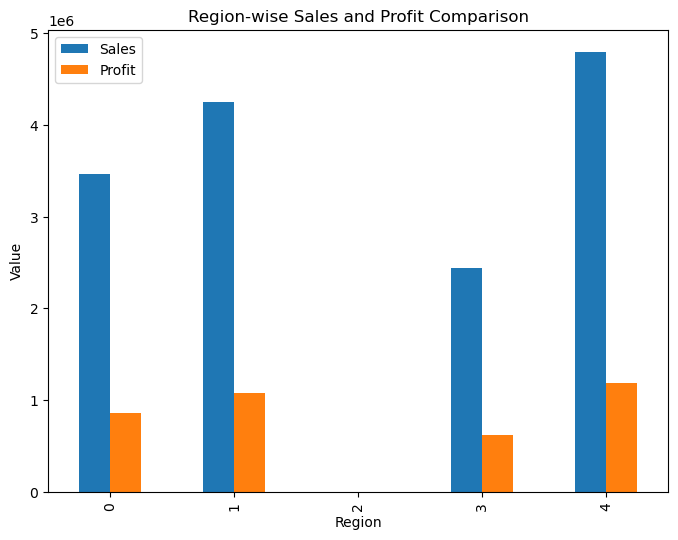

In [44]:
region_data = data.groupby('Region')[['Sales','Profit']].sum().reset_index()
region_data.plot(x='Region', y=['Sales','Profit'], kind='bar', figsize=(8,6))
plt.title('Region-wise Sales and Profit Comparison')
plt.ylabel('Value')
plt.show()


In [45]:
#Random Forest Regressor

In [46]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)

rf_mse = mean_squared_error(y_test, rf_pred)
rf_r2 = r2_score(y_test, rf_pred)

print("🌲 Random Forest Results:")
print(f"Mean Squared Error: {rf_mse:.2f}")
print(f"R² Score: {rf_r2:.2f}")


🌲 Random Forest Results:
Mean Squared Error: 13.17
R² Score: 1.00


In [47]:
#Model Comparison Visualization

C:\Users\priya\AppData\Local\Temp\ipykernel_24456\2534493876.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




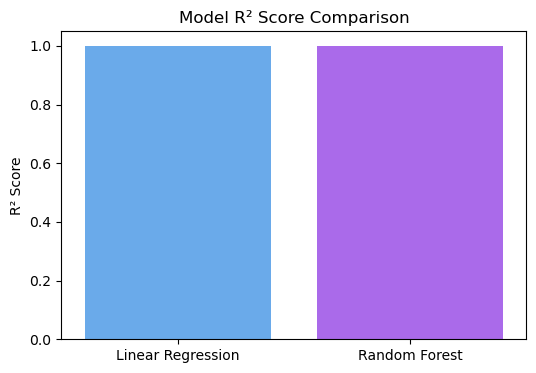

In [48]:
models = ['Linear Regression', 'Random Forest']
scores = [r2, rf_r2]

plt.figure(figsize=(6,4))
sns.barplot(x=models, y=scores, palette='cool')
plt.title('Model R² Score Comparison')
plt.ylabel('R² Score')
plt.show()


In [49]:
#Save the Model

In [50]:
import joblib

# Save the trained model
joblib.dump(rf_model, 'sales_prediction_model.pkl')

print("✅ Model Saved Successfully!")


✅ Model Saved Successfully!


In [51]:
#Future Sales Prediction (Use Saved Model)

In [52]:
# ✅ Correct Example Prediction Code (Final Working Version)

import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# 🧩 Assume your cleaned dataset (replace with your DataFrame)
# Example: data = pd.read_csv("superstore.csv")
data = data.copy()

# 🎯 Features & Target
X = data.drop('Sales', axis=1)
y = data['Sales']

# ⚙️ Select only numeric columns
numeric_cols = X.select_dtypes(include=['int64', 'float64']).columns
X_num = X[numeric_cols]

# 🧮 Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_num, y, test_size=0.2, random_state=42)

# 📏 Scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# 🌲 Model Training
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)

# ✅ Evaluate Model
y_pred = rf_model.predict(X_test)
print("✅ Model Evaluation Done")
print(f"MSE: {mean_squared_error(y_test, y_pred):.2f}")
print(f"R² Score: {r2_score(y_test, y_pred):.2f}")

# 🧾 Example Input (same number of numeric columns)
example_values = [0] * len(numeric_cols)  # sab 0 rakha gaya for shape match
example_df = pd.DataFrame([example_values], columns=numeric_cols)

# Example ke liye kuch sample values bhar do (random demo)
if 'Discount' in example_df.columns:
    example_df['Discount'] = 0.2
if 'Profit' in example_df.columns:
    example_df['Profit'] = 500
if 'Order Year' in example_df.columns:
    example_df['Order Year'] = 2017
if 'Order Month' in example_df.columns:
    example_df['Order Month'] = 10
if 'Order Day' in example_df.columns:
    example_df['Order Day'] = 15

# 🔢 Scale & Predict
example_scaled = scaler.transform(example_df)
predicted_sales = rf_model.predict(example_scaled)

print(f"🧾 Predicted Sales: ₹{predicted_sales[0]:.2f}")


✅ Model Evaluation Done
MSE: 16.02
R² Score: 1.00
🧾 Predicted Sales: ₹509.22


In [53]:
#Correlation with Profit

In [54]:
corr_profit = numeric_data.corr()['Profit'].sort_values(ascending=False)
print("📈 Correlation with Profit:")
print(corr_profit)


📈 Correlation with Profit:
Profit                   1.000000
Profit_after_Discount    0.984487
Profit Margin            0.747300
Sales                    0.605349
DayOfWeek                0.022627
Order Month              0.019021
Month                    0.019021
Order Year               0.010204
Year                     0.010204
Discount                 0.000017
Order Day               -0.031626
Day                     -0.031626
Name: Profit, dtype: float64


🎯 Model Accuracy: 100.0 %

📋 Classification Report:
               precision    recall  f1-score   support

        High       1.00      1.00      1.00      1207
         Low       1.00      1.00      1.00       321
      Medium       1.00      1.00      1.00       471

    accuracy                           1.00      1999
   macro avg       1.00      1.00      1.00      1999
weighted avg       1.00      1.00      1.00      1999



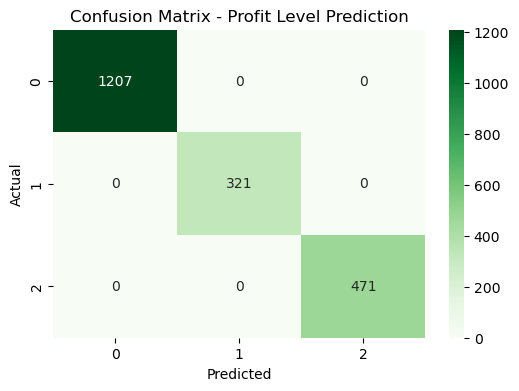

C:\Users\priya\AppData\Local\Temp\ipykernel_24456\1333692293.py:52: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




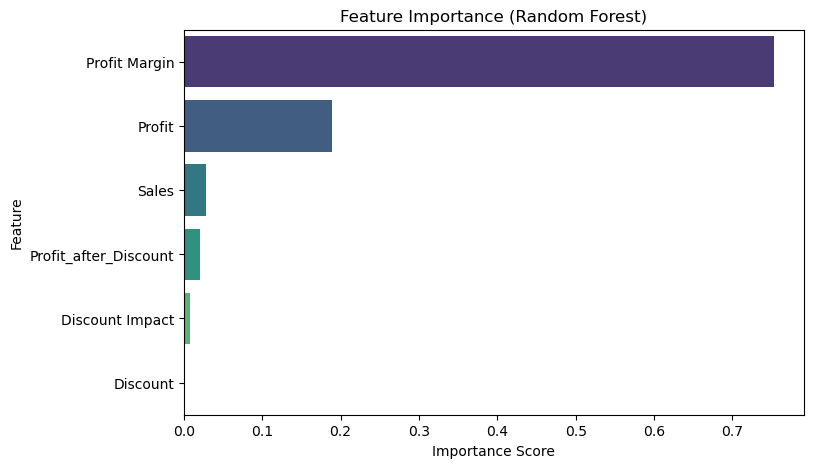

In [55]:
#Import Libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

#Create Profit_Level Feature
data['Profit_Ratio'] = (data['Profit'] / data['Sales']).round(2)
data['Profit_Level'] = pd.cut(
    data['Profit_Ratio'],
    bins=[-1, 0, 0.1, 0.2, 1],
    labels=['Loss', 'Low', 'Medium', 'High']
)

#Encode Categorical Columns
data_encoded = data.copy()
le = LabelEncoder()
for col in ['Category', 'Sub Category', 'Region', 'State', 'City']:
    data_encoded[col] = le.fit_transform(data_encoded[col].astype(str))

#Define Features & Target
X = data_encoded[['Sales', 'Discount', 'Profit', 'Profit Margin', 'Discount Impact', 'Profit_after_Discount']]
y = data_encoded['Profit_Level']

#Split Dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Train Model (Random Forest)
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

#Predictions & Evaluation
y_pred = rf.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print("🎯 Model Accuracy:", round(acc * 100, 2), "%")
print("\n📋 Classification Report:\n", classification_report(y_test, y_pred))

#Confusion Matrix
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap="Greens", fmt='d')
plt.title("Confusion Matrix - Profit Level Prediction")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

#Feature Importance Diagram
plt.figure(figsize=(8,5))
feat_importance = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
sns.barplot(x=feat_importance.values, y=feat_importance.index, palette='viridis')
plt.title("Feature Importance (Random Forest)")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()


In [ ]:
D